In [1]:
pip install imblearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.3/258.3 kB 4.8 MB/s eta 0:00:00


In [2]:
pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.9/153.9 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.0/199.0 MB 5.1 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, PowerTransformer, RobustScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, chi2, f_classif

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, BaggingClassifier, VotingClassifier, StackingClassifier

from xgboost import XGBClassifier
from imblearn.over_sampling import BorderlineSMOTE
from collections import Counter
from scipy.stats import zscore
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, classification_report, roc_curve, roc_auc_score

import pickle as pkl


In [5]:
df=pd.read_csv('/content/Rain_AUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,5.08,9.18,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,4.2,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,7.36,9.62,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,1.2,2.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,6.44,11.14,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,6.96,10.58,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,2.8,2.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,5.72,9.08,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [6]:
df.isnull().sum()

,0
Date,0
Location,0
MinTemp,0
MaxTemp,0
Rainfall,0
Evaporation,0
Sunshine,0
WindGustDir,0
WindGustSpeed,0
WindDir9am,0


In [7]:
df.duplicated().sum()

0

In [8]:
def column_info(data):
    cols=[]
    dtype=[]
    unique_v=[]
    nunique=[]

    for col in data.columns:
        cols.append(col)
        dtype.append(data[col].dtype.name)
        unique_v.append(data[col].unique())
        nunique.append(data[col].nunique())

    return pd.DataFrame({'Column':cols,"Data type":dtype,"Unique Values":unique_v,"num_unique values":nunique})

In [9]:
column_info(df)

,Column,Data type,Unique Values,num_unique values
0,Date,object,"[2008-12-01, 2008-12-02, 2008-12-03, 2008-12-0...",3436
1,Location,object,"[Albury, BadgerysCreek, Cobar, CoffsHarbour, M...",49
2,MinTemp,float64,"[13.4, 7.4, 12.9, 9.2, 17.5, 14.6, 14.3, 7.7, ...",566
3,MaxTemp,float64,"[22.9, 25.1, 25.7, 28.0, 32.3, 29.7, 25.0, 26....",653
4,Rainfall,float64,"[0.6, 0.0, 1.0, 0.2, 1.4, 2.2, 15.6, 3.6, 0.12...",1034
5,Evaporation,float64,"[5.08, 7.360000000000001, 6.44, 6.959999999999...",1728
6,Sunshine,float64,"[9.179999999999998, 9.62, 11.14, 10.58, 9.0800...",1456
7,WindGustDir,object,"[W, WNW, WSW, NE, NNW, N, NNE, SW, ENE, SSE, S...",16
8,WindGustSpeed,float64,"[44.0, 46.0, 24.0, 41.0, 56.0, 50.0, 35.0, 80....",370
9,WindDir9am,object,"[W, NNW, SE, ENE, SW, SSE, S, NE, N, SSW, WSW,...",16


In [10]:
df['Evaporation']=df['Evaporation'].round(3)
df['Sunshine']=df['Sunshine'].round(3)

In [11]:
column_info(df)

,Column,Data type,Unique Values,num_unique values
0,Date,object,"[2008-12-01, 2008-12-02, 2008-12-03, 2008-12-0...",3436
1,Location,object,"[Albury, BadgerysCreek, Cobar, CoffsHarbour, M...",49
2,MinTemp,float64,"[13.4, 7.4, 12.9, 9.2, 17.5, 14.6, 14.3, 7.7, ...",566
3,MaxTemp,float64,"[22.9, 25.1, 25.7, 28.0, 32.3, 29.7, 25.0, 26....",653
4,Rainfall,float64,"[0.6, 0.0, 1.0, 0.2, 1.4, 2.2, 15.6, 3.6, 0.12...",1034
5,Evaporation,float64,"[5.08, 7.36, 6.44, 6.96, 5.72, 6.28, 7.72, 6.2...",1063
6,Sunshine,float64,"[9.18, 9.62, 11.14, 10.58, 9.08, 9.36, 10.9, 9...",683
7,WindGustDir,object,"[W, WNW, WSW, NE, NNW, N, NNE, SW, ENE, SSE, S...",16
8,WindGustSpeed,float64,"[44.0, 46.0, 24.0, 41.0, 56.0, 50.0, 35.0, 80....",370
9,WindDir9am,object,"[W, NNW, SE, ENE, SW, SSE, S, NE, N, SSW, WSW,...",16


In [12]:
num_cols=df.select_dtypes(include=['number']).columns
num_cols

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

In [13]:
for col in df.columns:
    if col in num_cols:
        df[col] = df[col].round(3)

In [14]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000,141851.000000
mean,12.209422,23.252606,2.347551,5.217511,7.492073,39.823243,14.059148,18.656915,68.863358,51.506977,1017.773201,1015.362920,4.374348,4.439489,16.984100,21.738696
std,6.389713,7.096254,8.386186,3.731274,3.453734,13.516311,8.862933,8.792514,19.037017,20.755524,6.963190,6.886247,2.608411,2.432657,6.496004,6.948850
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.600000,17.900000,0.000000,2.600000,5.000000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.200000,1010.700000,2.000000,2.200000,12.300000,16.600000
50%,12.000000,22.600000,0.000000,4.600000,8.060000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.800000,1015.400000,4.600000,4.600000,16.700000,21.100000
75%,16.900000,28.300000,0.800000,6.960000,10.300000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.500000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


#Preprocessing

In [15]:
df.drop(['Date','Location'],axis=1,inplace=True)

In [16]:
df.duplicated().sum()

0

In [17]:
df.drop_duplicates(inplace=True)

#Outliers Handling

In [18]:
fig = make_subplots(rows=4, cols=4, subplot_titles=num_cols)
for i, col in enumerate(num_cols, start=1):
    row_num = (i - 1) // 4 + 1
    col_num = (i - 1) % 4 + 1
    fig.add_trace(
        go.Box(
            x=df[col],
            name='',
            marker_color='rgba(0, 162, 232, 0.7)',
            line_color='rgba(0, 85, 153, 1)'
        ),
        row=row_num,
        col=col_num
    )
fig.update_layout(
    title_text="Horizontal Boxplots of Numerical Columns",
    title_font=dict(size=24, color='rgba(0, 85, 153, 1)'),
    showlegend=False,
    plot_bgcolor="#E0F7FA",
    paper_bgcolor="#B2EBF2"
)
fig.show()

In [19]:
df['Z_Score'] = zscore(df['MinTemp'])
threshold = 3
lower_bound = df['MinTemp'].mean() - threshold * df['MinTemp'].std()
upper_bound = df['MinTemp'].mean() + threshold * df['MinTemp'].std()
df['MinTemp'] = df['MinTemp'].clip(lower=lower_bound, upper=upper_bound)
df.drop(columns='Z_Score', inplace=True)

In [20]:
df['Z_Score'] = zscore(df['MaxTemp'])
threshold = 3
lower_bound = df['MaxTemp'].mean() - threshold * df['MaxTemp'].std()
upper_bound = df['MaxTemp'].mean() + threshold * df['MaxTemp'].std()
df['MaxTemp'] = df['MaxTemp'].clip(lower=lower_bound, upper=upper_bound)
df.drop(columns='Z_Score', inplace=True)

In [21]:
df['Z_Score'] = zscore(df['Rainfall'])
threshold = 3
lower_bound = df['Rainfall'].mean() - threshold * df['Rainfall'].std()
upper_bound = df['Rainfall'].mean() + threshold * df['Rainfall'].std()
df['Rainfall'] = df['Rainfall'].clip(lower=lower_bound, upper=upper_bound)
df.drop(columns='Z_Score', inplace=True)

In [22]:
Q1 = df['Evaporation'].quantile(0.25)
Q3 = df['Evaporation'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
df['Evaporation'] = df['Evaporation'].clip(lower=lower_bound, upper=upper_bound)

In [23]:
df['Z_Score'] = zscore(df['WindGustSpeed'])
threshold = 3
lower_bound = df['WindGustSpeed'].mean() - threshold * df['WindGustSpeed'].std()
upper_bound = df['WindGustSpeed'].mean() + threshold * df['WindGustSpeed'].std()
df['WindGustSpeed'] = df['WindGustSpeed'].clip(lower=lower_bound, upper=upper_bound)
df.drop(columns='Z_Score', inplace=True)

In [24]:
df['Z_Score'] = zscore(df['WindSpeed9am'])
threshold = 3
lower_bound = df['WindSpeed9am'].mean() - threshold * df['WindSpeed9am'].std()
upper_bound = df['WindSpeed9am'].mean() + threshold * df['WindSpeed9am'].std()
df['WindSpeed9am'] = df['WindSpeed9am'].clip(lower=lower_bound, upper=upper_bound)
df.drop(columns='Z_Score', inplace=True)

In [25]:
df['Z_Score'] = zscore(df['WindSpeed3pm'])
threshold = 3
lower_bound = df['WindSpeed3pm'].mean() - threshold * df['WindSpeed3pm'].std()
upper_bound = df['WindSpeed3pm'].mean() + threshold * df['WindSpeed3pm'].std()
df['WindSpeed3pm'] = df['WindSpeed3pm'].clip(lower=lower_bound, upper=upper_bound)
df.drop(columns='Z_Score', inplace=True)

In [26]:
df['Z_Score'] = zscore(df['Humidity9am'])
threshold = 3
lower_bound = df['Humidity9am'].mean() - threshold * df['Humidity9am'].std()
upper_bound = df['Humidity9am'].mean() + threshold * df['Humidity9am'].std()
df['Humidity9am'] = df['Humidity9am'].clip(lower=lower_bound, upper=upper_bound)
df.drop(columns='Z_Score', inplace=True)

In [27]:
df['Z_Score'] = zscore(df['Pressure9am'])
threshold = 3
lower_bound = df['Pressure9am'].mean() - threshold * df['Pressure9am'].std()
upper_bound = df['Pressure9am'].mean() + threshold * df['Pressure9am'].std()
df['Pressure9am'] = df['Pressure9am'].clip(lower=lower_bound, upper=upper_bound)
df.drop(columns='Z_Score', inplace=True)


In [28]:
df['Z_Score'] = zscore(df['Pressure3pm'])
threshold = 3
lower_bound = df['Pressure3pm'].mean() - threshold * df['Pressure3pm'].std()
upper_bound = df['Pressure3pm'].mean() + threshold * df['Pressure3pm'].std()
df['Pressure3pm'] = df['Pressure3pm'].clip(lower=lower_bound, upper=upper_bound)
df.drop(columns='Z_Score', inplace=True)

#Encoding

In [29]:
label=LabelEncoder()
df['RainTomorrow']=label.fit_transform(df['RainTomorrow'])
df['RainToday']=label.fit_transform(df['RainToday'])
pkl.dump(label,open('RainToday_le.pkl','wb'))

In [30]:
ordinal=OrdinalEncoder(categories=[['E','ENE', 'ESE', 'SE', 'NE', 'SSE', 'SW', 'SSW', 'S', 'NNE', 'WSW', 'W', 'N', 'WNW', 'NW', 'NNW']],dtype=int)
df['WindGustDir']=ordinal.fit_transform(df[['WindGustDir']])
pkl.dump(ordinal,open('WindGustDir_le.pkl','wb'))

df['WindDir9am']=ordinal.fit_transform(df[['WindDir9am']])
pkl.dump(ordinal,open('WindDir9am_le.pkl','wb'))

df['WindDir3pm']=ordinal.fit_transform(df[['WindDir3pm']])
pkl.dump(ordinal,open('WindDir3pm_le.pkl','wb'))

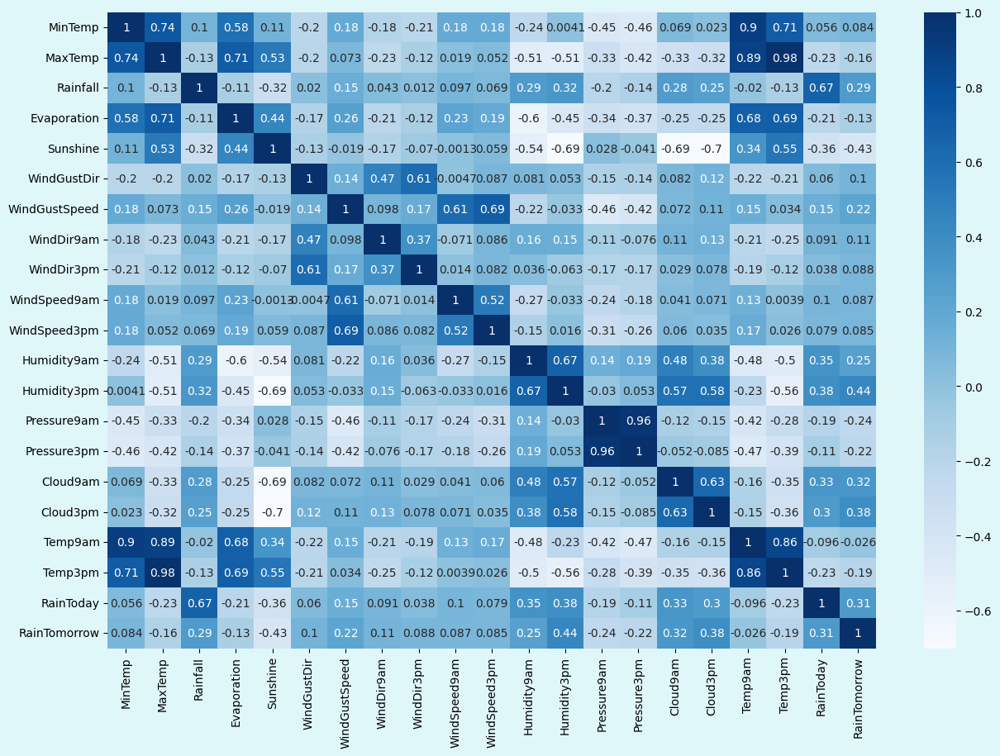

In [31]:
fig, ax = plt.subplots(figsize=(15, 10))
ax=sns.heatmap(df.corr(), annot=True, cmap='Blues')
fig.patch.set_facecolor('#E0F7FA')
plt.show()

In [32]:
df.drop(['Pressure9am','Temp3pm','Humidity9am','Temp9am'],axis=1,inplace=True)

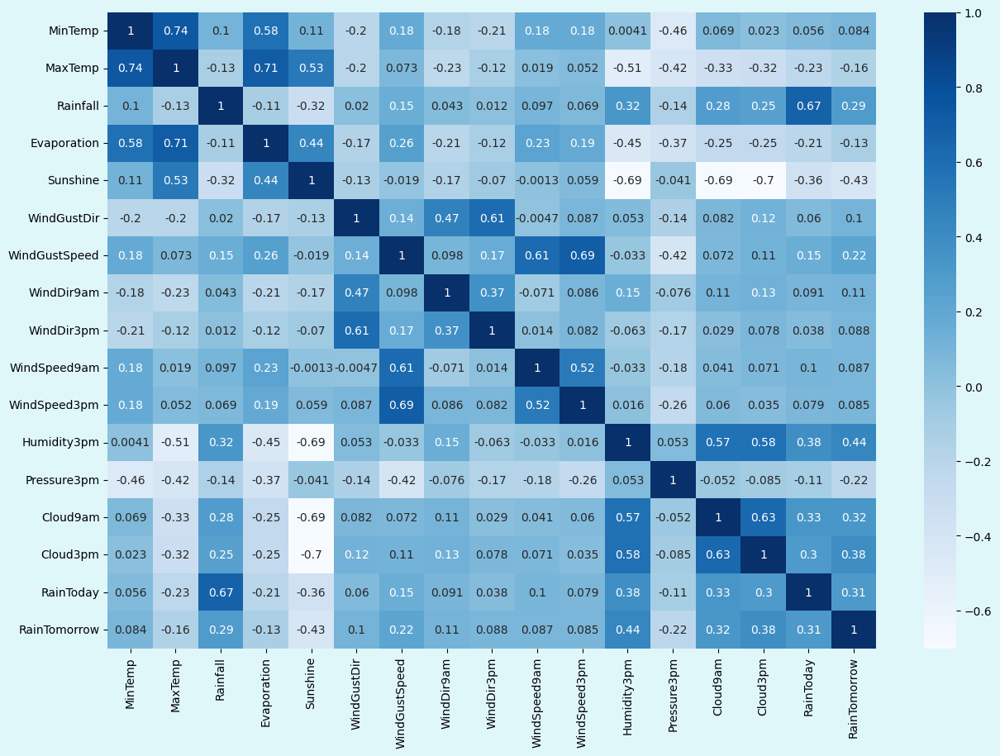

In [33]:
fig, ax = plt.subplots(figsize=(15, 10))
ax=sns.heatmap(df.corr(), annot=True, cmap='Blues')
fig.patch.set_facecolor('#E0F7FA')
plt.show()

#Split Data

In [34]:
x=df.drop('RainTomorrow',axis=1)
y=df['RainTomorrow']

In [35]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, stratify=y, random_state=42)
x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train, test_size=0.2, stratify=y_train, random_state=42)

In [36]:
smote = BorderlineSMOTE(sampling_strategy=0.5,random_state=42)
x_train, y_train = smote.fit_resample(x_train, y_train)

In [37]:
pt = PowerTransformer(method='yeo-johnson')
x_train = pt.fit_transform(x_train)
x_test = pt.transform(x_test)
x_valid= pt.transform(x_valid)
pkl.dump(pt,open('pt.pkl','wb'))

In [38]:
scaler=RobustScaler()
x_train=scaler.fit_transform(x_train)
x_valid=scaler.transform(x_valid)
x_test=scaler.transform(x_test)
pkl.dump(scaler,open('scaler.pkl','wb'))

In [56]:
def check_overfitting(model,x_train,y_train,x_vald,y_vald):
        y_tr_pred=model.predict(x_train)
        train_accuracy=accuracy_score(y_train,y_tr_pred)
        train_precision=precision_score(y_train,y_tr_pred)
        y_val_pred=model.predict(x_vald)
        valid_accuracy=accuracy_score(y_vald,y_val_pred)
        valid_precision=precision_score(y_vald,y_val_pred)
        print("Model Metrics for CheckingOverfitting")
        print(f"Accuracy_ train {train_accuracy}")
        print(f"precision_ train {train_precision}")
        print(f"Accuracy_ validation {valid_accuracy}")
        print(f"precision_ validation {valid_precision}")

#Logistic

In [57]:
logistic = LogisticRegression(class_weight='balanced', random_state=42)

param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'lbfgs']
}

grid_search = GridSearchCV(logistic, param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(x_train, y_train)

best_logistic = grid_search.best_estimator_


In [58]:
check_overfitting(best_logistic,x_train,y_train,x_valid,y_valid)

Model Metrics for CheckingOverfitting
Accuracy_ train 0.770437172873442
precision_ train 0.6262744289412789
Accuracy_ validation 0.7774938315121608
precision_ validation 0.49631480324797


In [59]:
y_pred=best_logistic.predict(x_test)
logistic_accuracy=accuracy_score(y_test,y_pred)
logistic_accuracy

0.7799866060413803

In [60]:
confusion_matrix(y_test,y_pred)

array([[17257,  4875],
       [ 1367,  4872]])

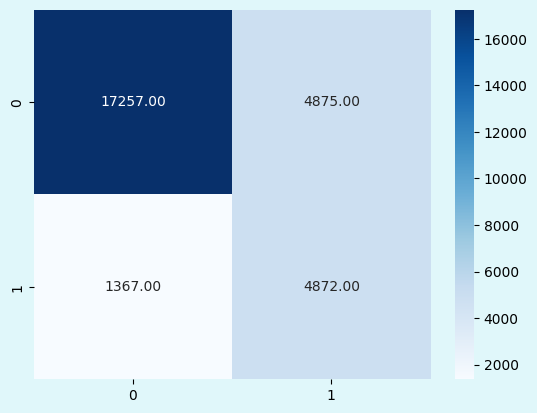

In [61]:
fig = plt.figure()
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt='.2f',cmap='Blues')
fig.patch.set_facecolor('#E0F7FA')
ax = plt.gca()
plt.show()

In [62]:
pkl.dump(best_logistic,open('logistic.pkl',"wb"))

# Xg Boosting

In [63]:
xg_model =XGBClassifier(
    learning_rate=0.1,
    max_depth=6,
    n_estimators=200,
    reg_alpha=0.1,
    reg_lambda=1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
xg_model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [64]:
check_overfitting(xg_model,x_train,y_train,x_valid,y_valid)

Model Metrics for CheckingOverfitting
Accuracy_ train 0.877056896486802
precision_ train 0.8524078337380554
Accuracy_ validation 0.8453031371166725
precision_ validation 0.6757719714964371


In [65]:
y_pred=xg_model.predict(x_test)
xg_accuracy=accuracy_score(y_test,y_pred)
xg_accuracy

0.8484015367805153

In [66]:
confusion_matrix(y_test,y_pred)

array([[20473,  1659],
       [ 2642,  3597]])

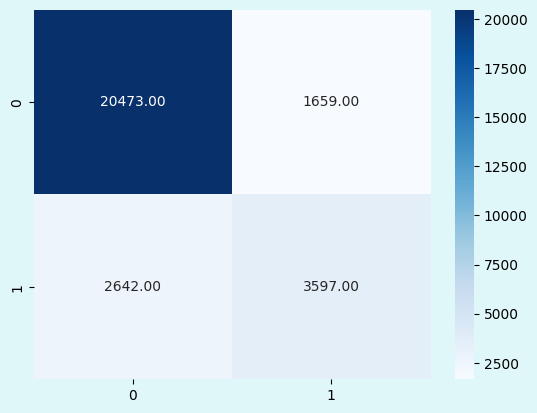

In [67]:
fig = plt.figure()
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt='.2f',cmap='Blues')
fig.patch.set_facecolor('#E0F7FA')
ax = plt.gca()
plt.show()

In [68]:
pkl.dump(xg_model,open('XG.pkl',"wb"))

# Bagging Different

In [69]:
estimators = [('logistic', LogisticRegression()), ('Decision Tree', DecisionTreeClassifier())]
voting = VotingClassifier(estimators=estimators)

In [70]:
bagging_different = BaggingClassifier(estimator=voting,n_estimators=100,random_state=42)
bagging_different.fit(x_train, y_train)

BaggingClassifier(estimator=VotingClassifier(estimators=[('logistic',
                                                          LogisticRegression()),
                                                         ('Decision Tree',
                                                          DecisionTreeClassifier())]),
                  n_estimators=100, random_state=42)

In [71]:
check_overfitting(bagging_different,x_train,y_train,x_valid,y_valid)

Model Metrics for CheckingOverfitting
Accuracy_ train 0.8644425198629363
precision_ train 0.9999524058826329
Accuracy_ validation 0.8452150158618259
precision_ validation 0.7001625135427952


In [72]:
y_pred=bagging_different.predict(x_test)
bagging_different_accuracy=accuracy_score(y_test,y_pred)
bagging_different_accuracy

0.8482957950019386

In [73]:
confusion_matrix(y_test,y_pred)

array([[20772,  1360],
       [ 2944,  3295]])

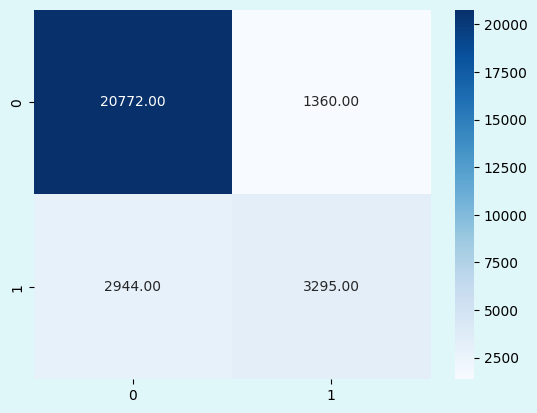

In [74]:
fig = plt.figure()
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt='.2f',cmap='Blues')
fig.patch.set_facecolor('#E0F7FA')
ax = plt.gca()
plt.show()

In [75]:
pkl.dump(bagging_different,open('bagging_different.pkl',"wb"))

#Stacking

In [76]:
estimators= [('xg', XGBClassifier()),('Logistic', LogisticRegression(),('rf', RandomForestClassifier()),('dt', DecisionTreeClassifier()))]
stacking=StackingClassifier(estimators=estimators,final_estimator=LogisticRegression())
stacking.fit(x_train,y_train)
check_overfitting(stacking,x_train,y_train,x_valid,y_valid)

Model Metrics for CheckingOverfitting
Accuracy_ train 0.8877226343336974
precision_ train 0.8634084437291073
Accuracy_ validation 0.8446422277053225
precision_ validation 0.669442516770761


In [77]:
y_pred=stacking.predict(x_test)
stacking_accuracy=accuracy_score(y_test,y_pred)
stacking_accuracy

0.8473441189947482

In [78]:
confusion_matrix(y_test,y_pred)

array([[20425,  1707],
       [ 2624,  3615]])

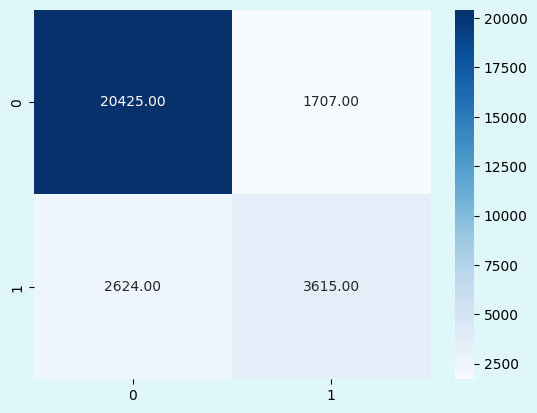

In [79]:
fig = plt.figure()
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt='.2f',cmap='Blues')
fig.patch.set_facecolor('#E0F7FA')
ax = plt.gca()
plt.show()

In [80]:
pkl.dump(stacking,open('stacking.pkl',"wb"))

#Compare

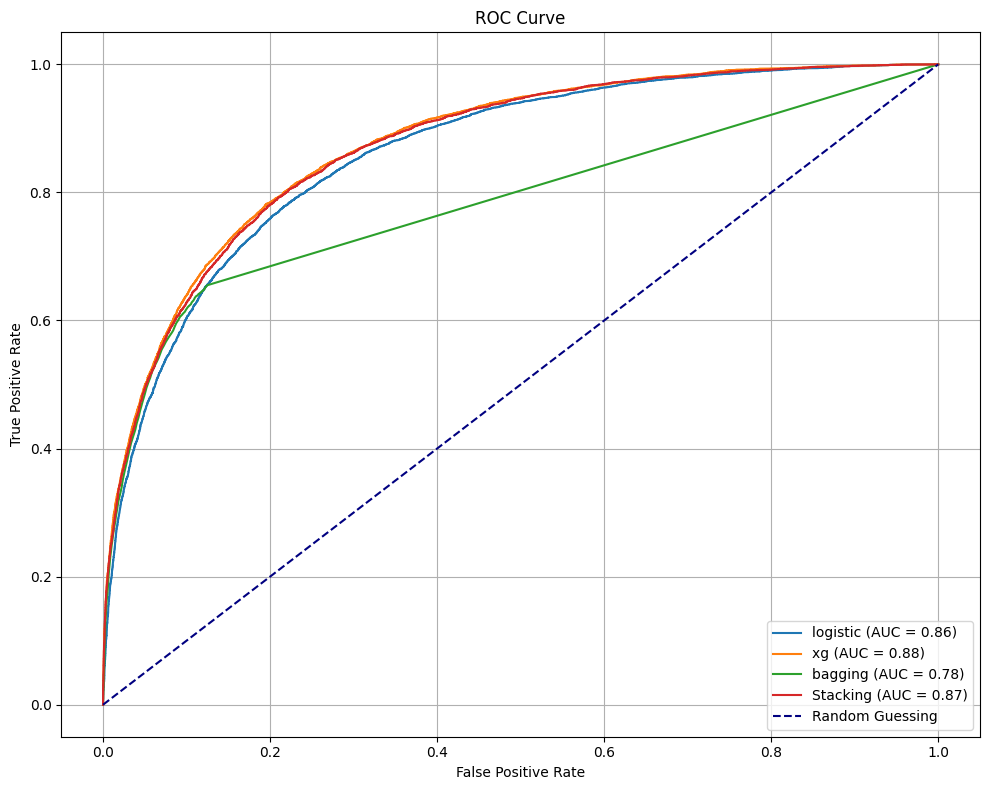

In [81]:
models = [('logistic',best_logistic),('xg',xg_model),('bagging',bagging_different),('Stacking',stacking)]

plt.figure(figsize=(10, 8))
for name, model in models:
    y_prob = model.predict_proba(x_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    auc = roc_auc_score(y_test, y_prob)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()